# A Small-Scale Replication of Caruana & Niculescu-Mizil (CNM06)
## COGS 118A | Urmi Suresh | A15593367

In [97]:
# import statements
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC 

from sklearn.metrics import f1_score, roc_auc_score
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

from time import perf_counter 

import seaborn as sns
sns.set()
sns.set_context('talk')

## Data Cleaning

### avila data set

In [2]:
# load in data
avilaTraining = pd.read_csv('data/avila-tr.txt', header=None)
avilaTesting = pd.read_csv('data/avila-ts.txt', header=None)

In [3]:
# combine training and testing datasets to produce 1 dataset
frames = [avilaTraining, avilaTesting]
avila = pd.concat(frames).reset_index(drop=True)

In [4]:
# rename columns
avila.columns = ['F1', 'F2', 'F3', 'F4', 'F5', 'F6', 'F7' ,'F8', 'F9', 'F10', 'copyist']

In [5]:
# replace A (because has most values) with 1 and the rest with 0 
avila.copyist = avila.copyist.replace(['A'], 1)
avila.copyist = avila.copyist.replace(['F', 'E', 'I', 'X', 'H', 'G', 'D', 'Y', 'C', 'W', 'B'], 0)

In [6]:
avila.copyist.value_counts() 

0    12295
1     8572
Name: copyist, dtype: int64

In [7]:
print(avila.shape)
avila.head()

(20867, 11)


,F1,F2,F3,F4,F5,F6,F7,F8,F9,F10,copyist
0,0.266074,-0.165620,0.320980,0.483299,0.172340,0.273364,0.371178,0.929823,0.251173,0.159345,1
1,0.130292,0.870736,-3.210528,0.062493,0.261718,1.436060,1.465940,0.636203,0.282354,0.515587,1
2,-0.116585,0.069915,0.068476,-0.783147,0.261718,0.439463,-0.081827,-0.888236,-0.123005,0.582939,1
3,0.031541,0.297600,-3.210528,-0.583590,-0.721442,-0.307984,0.710932,1.051693,0.594169,-0.533994,1
4,0.229043,0.807926,-0.052442,0.082634,0.261718,0.148790,0.635431,0.051062,0.032902,-0.086652,0


### california housing data set

In [13]:
# load in data
calHousing = pd.read_csv('data/cal_housing.data', header=None)

In [14]:
# rename columns
calHousing.columns = ['longitude', 'latitude', 'housing_median_age', 'total_rooms', 'total_bedrooms', 'population', 'households' ,'median_income', 'median_house_value']

In [15]:
# separated the output variable into 1 and 0 based on if median_house_value is > 13000 or not
calHousing.median_house_value = np.where(calHousing.median_house_value > 130000, 1, 0)

In [16]:
calHousing.median_house_value.value_counts()

1    14728
0     5912
Name: median_house_value, dtype: int64

In [17]:
print(calHousing.shape)
calHousing.head()

(20640, 9)


,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,1
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,1
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,1
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,1
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,1


### electrical grid stability simulated data set

In [8]:
# load in data
electric = pd.read_csv('data/electrical_grid.csv')

In [9]:
# rename columns
electric = electric.rename(columns={'stabf':'stability'})

In [10]:
# turn 'stable' to 1 and 'unstable' to 0
electric.stability = electric.stability.replace(['stable'], 1)
electric.stability = electric.stability.replace(['unstable'], 0)

In [11]:
electric.stability.value_counts()

0    6380
1    3620
Name: stability, dtype: int64

In [12]:
print(electric.shape)
electric.head()

(10000, 14)


,tau1,tau2,tau3,tau4,p1,p2,p3,p4,g1,g2,g3,g4,stab,stability
0,2.959060,3.079885,8.381025,9.780754,3.763085,-0.782604,-1.257395,-1.723086,0.650456,0.859578,0.887445,0.958034,0.055347,0
1,9.304097,4.902524,3.047541,1.369357,5.067812,-1.940058,-1.872742,-1.255012,0.413441,0.862414,0.562139,0.781760,-0.005957,1
2,8.971707,8.848428,3.046479,1.214518,3.405158,-1.207456,-1.277210,-0.920492,0.163041,0.766689,0.839444,0.109853,0.003471,0
3,0.716415,7.669600,4.486641,2.340563,3.963791,-1.027473,-1.938944,-0.997374,0.446209,0.976744,0.929381,0.362718,0.028871,0
4,3.134112,7.608772,4.943759,9.857573,3.525811,-1.125531,-1.845975,-0.554305,0.797110,0.455450,0.656947,0.820923,0.049860,0


### letter recognition data set

In [18]:
# load in data
letter = pd.read_csv('data/letter-recognition.data', header=None)

In [19]:
# rename columns
letter.columns = ['capital_letter', 'x-box', 'y-box', 'width', 'height', 'pixels', 'x-bar' ,'y-bar', 'x2-bar', 'y2-bar', 'xy-bar', 'x2y-bar', 'xy2-bar', 'x-edge', 'x-edge_y', 'y-edge', 'y-edge_x']

In [20]:
# turn letters A-M to positive (1) and N-Z to negative (0)
letter.capital_letter = letter.capital_letter.replace(['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M'], 1)
letter.capital_letter = letter.capital_letter.replace(['N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z'], 0)

In [21]:
letter.capital_letter.value_counts()

0    10060
1     9940
Name: capital_letter, dtype: int64

In [22]:
print(letter.shape)
letter.head()

(20000, 17)


,capital_letter,x-box,y-box,width,height,pixels,x-bar,y-bar,x2-bar,y2-bar,xy-bar,x2y-bar,xy2-bar,x-edge,x-edge_y,y-edge,y-edge_x
0,0,2,8,3,5,1,8,13,0,6,6,10,8,0,8,0,8
1,1,5,12,3,7,2,10,5,5,4,13,3,9,2,8,4,10
2,1,4,11,6,8,6,10,6,2,6,10,3,7,3,7,3,9
3,0,7,11,6,6,3,5,9,4,6,4,4,10,6,10,2,8
4,1,2,1,3,1,1,8,6,6,6,6,5,9,1,7,5,10


## Data Visualization 

### avila

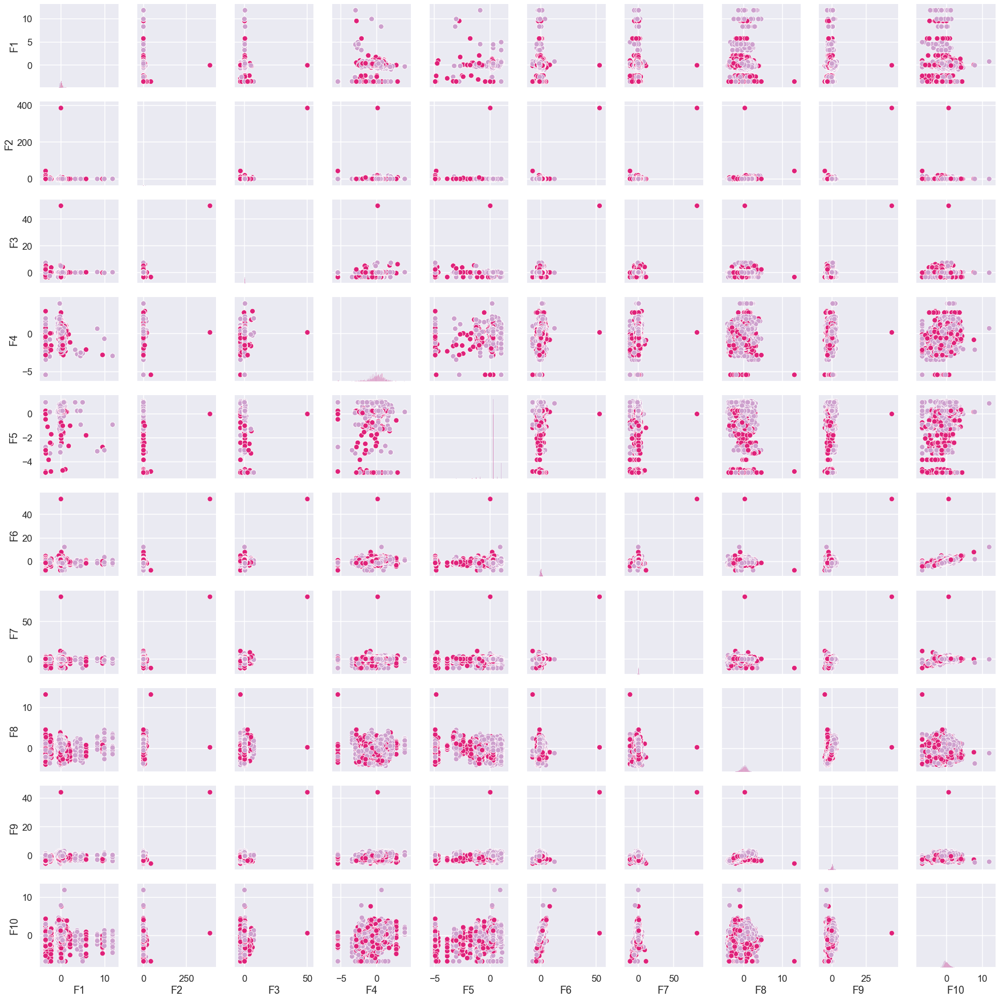

In [42]:
avilaGraph = sns.PairGrid(avila, hue='copyist', palette="PuRd")
avilaGraph.map_diag(sns.histplot)
avilaGraph.map_offdiag(sns.scatterplot)

### california housing

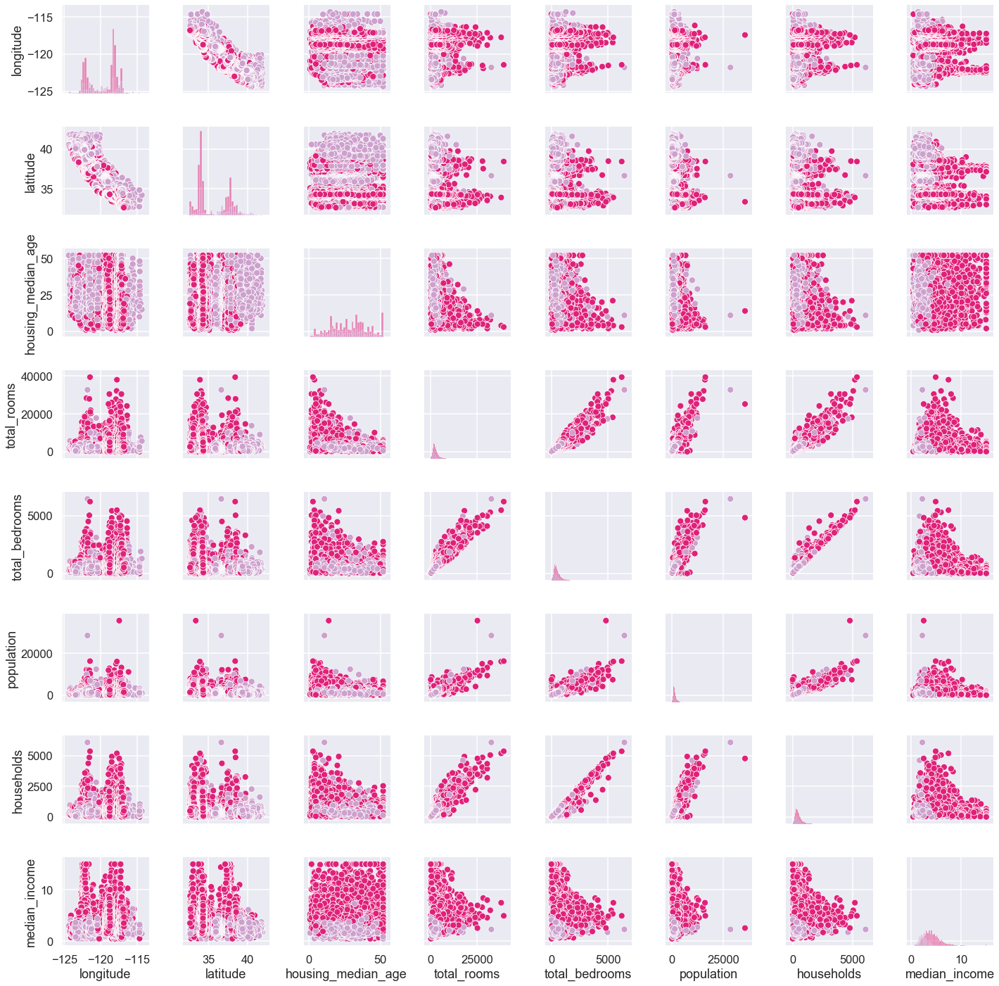

In [43]:
calGraph = sns.PairGrid(calHousing, hue='median_house_value', palette='PuRd')
calGraph.map_diag(sns.histplot)
calGraph.map_offdiag(sns.scatterplot)

### electrical grid

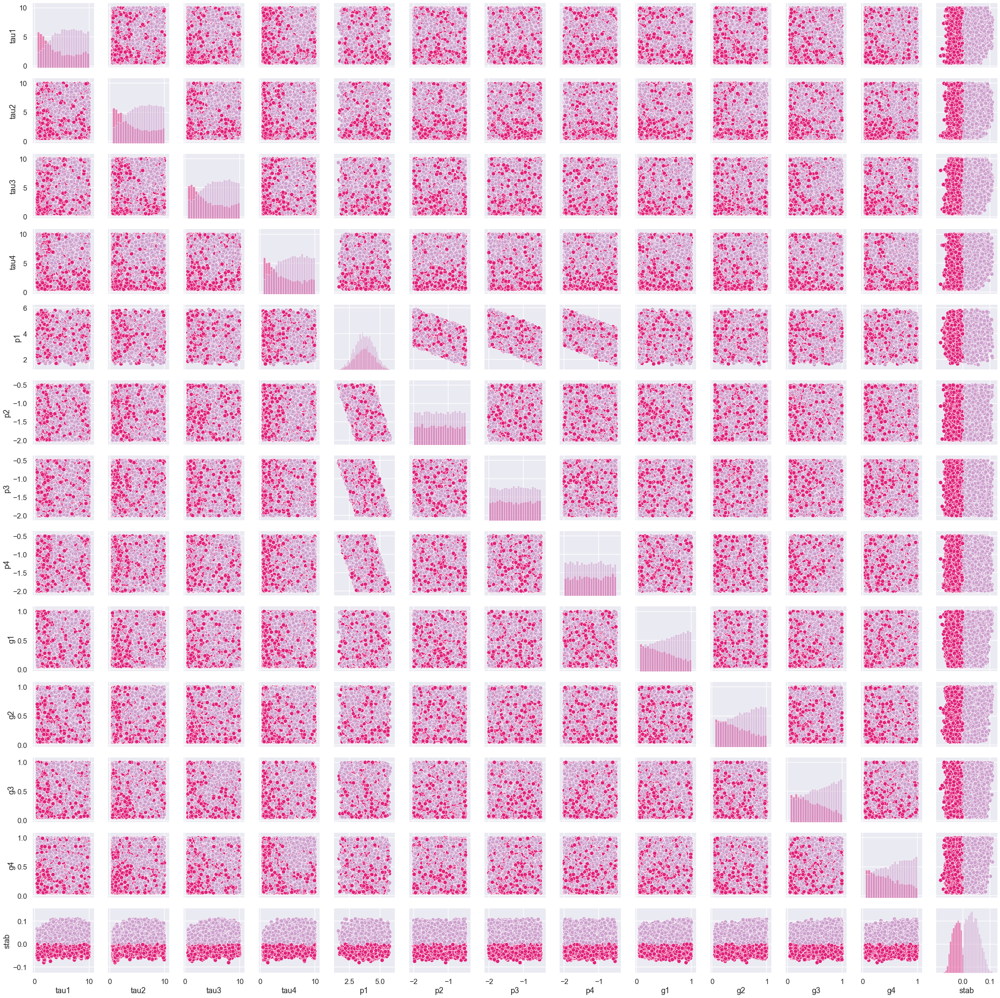

In [44]:
electricGraph = sns.PairGrid(electric, hue='stability', palette='PuRd')
electricGraph.map_diag(sns.histplot)
electricGraph.map_offdiag(sns.scatterplot)

### letter

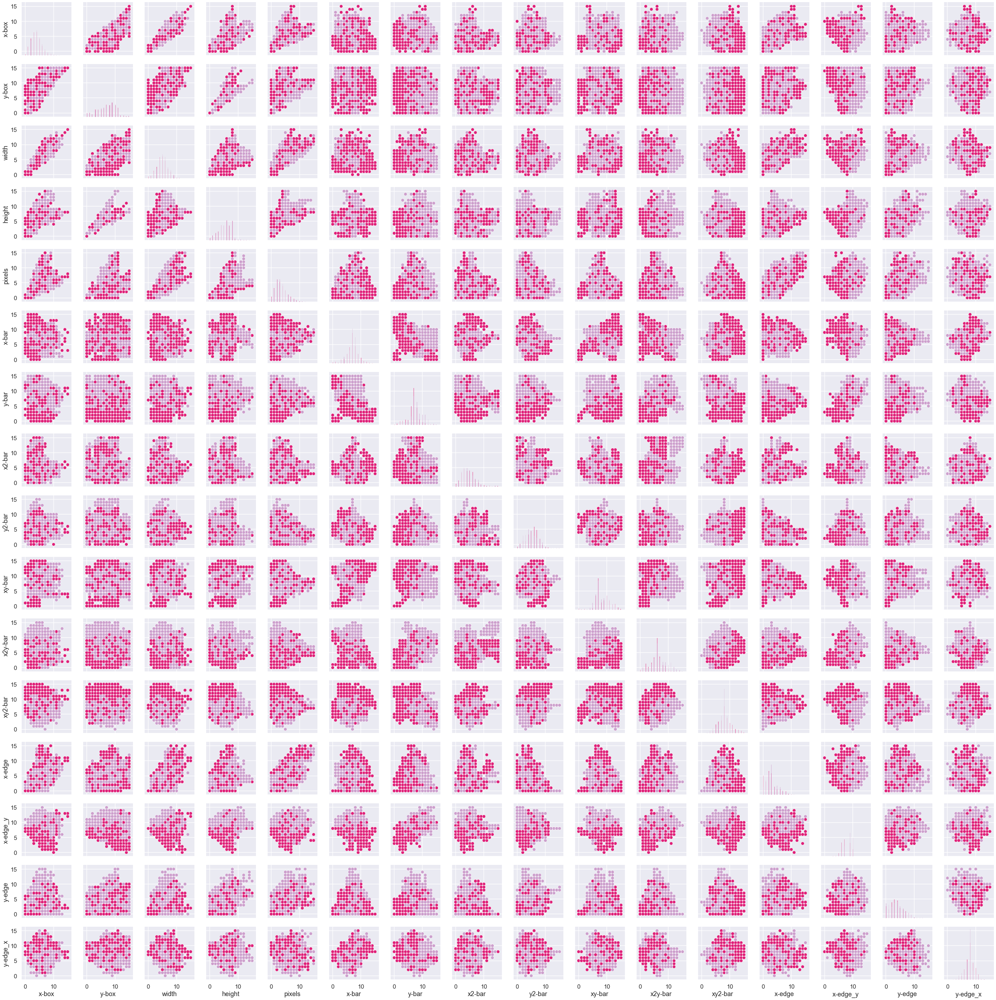

In [45]:
letterGraph = sns.PairGrid(letter, hue='capital_letter', palette='PuRd')
letterGraph.map_diag(sns.histplot)
letterGraph.map_offdiag(sns.scatterplot)

## Analysis 

In [23]:
# start by splitting up X and y for all datasets 

# avila data set
Xavila = avila.iloc[:, :-1]
yavila = avila.iloc[:, -1:]

# california housing data set 
Xcalhous = calHousing.iloc[:, :-1]
ycalhous = calHousing.iloc[:, -1:]

# electrical grid data set
Xelectric = electric.iloc[:, :-1]
yelectric = electric.iloc[:, -1:]

# letter data set
Xletter = letter.iloc[:, 1:]
yletter = letter.iloc[:, 0]

# make lists of X's and y's 
Xtotal = [Xavila, Xcalhous, Xelectric, Xletter]
Ytotal = [yavila, ycalhous, yelectric, yletter]

### SVM (support vector machines)

In [24]:
# start timer 
SVMstart = perf_counter()  

# initialize empty metric lists that will be filled in 
metricsSVMTest = []; metricsSVMTrain = []
accuracyTest_SVMall = []; aucTest_SVMall = []; fscTest_SVMall = []
accuracyTrain_SVMall = []; aucTrain_SVMall = []; fscTrain_SVMall = []
datasetMetricsSVM = []

# for each dataset 
for dataset in range(len(Xtotal)):
    
    # initialize empty lists for each metric
    accuracyTest_trials = []; aucTest_trials = []; fscTest_trials = []
    accuracyTrain_trials = []; aucTrain_trials = []; fscTrain_trials = []

    # initialize X and y dataframes
    X = Xtotal[dataset]
    y = Ytotal[dataset]

    # for each trial
    for trial in range(5):

        # split into 5000 random samples and the rest of the dataset 
        Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, train_size=5000)

        # create lists of hyperparameters 
        Cvals = [10**-7, 10**-6, 10**-5, 10**-4, 10**-3, 10**-2, 10**-1, 10**0, 10**1, 10**2, 10**3]
        gamma_list = [0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1, 2]
        degree_list = [2,3]    
        scoring = {'accuracy':'accuracy', 'fsc':'f1', 'auc':'roc_auc'}

        # create a pipeline 
        pipe = Pipeline([('std', StandardScaler()),
                 ('classifier', SVC(probability=True))])

        # Create search space of candidate learning algorithms and their hyperparameters
        search_space = [{'classifier': [SVC()],
                         'classifier__kernel': ['linear'],
                         'classifier__C': Cvals},
                        {'classifier': [SVC()],
                         'classifier__kernel': ['poly'],
                         'classifier__degree': degree_list,
                         'classifier__C': Cvals},
                        {'classifier': [SVC()],
                         'classifier__kernel': ['rbf'],
                         'classifier__gamma': gamma_list,
                         'classifier__C': Cvals}
                        ]

        gs = GridSearchCV(pipe, search_space, scoring=scoring, cv=StratifiedKFold(n_splits=5), refit=False)

        # train the data 
        bestModel = gs.fit(Xtrain, ytrain)

        # finding optimal accuracy, optimal auc, and optimal fsc
        bestAcc = bestModel.cv_results_['params'][np.argmin(bestModel.cv_results_['rank_test_accuracy'])]
        bestAUC = bestModel.cv_results_['params'][np.argmin(bestModel.cv_results_['rank_test_auc'])]
        bestFSC = bestModel.cv_results_['params'][np.argmin(bestModel.cv_results_['rank_test_fsc'])]

        # function to get correct parameters based on the best kernel 
        def pickModel(metric):
            if metric['classifier__kernel'] == 'linear':
                model = SVC(kernel=metric['classifier__kernel'], C=metric['classifier__C'], probability=True)
            elif metric['classifier__kernel'] == 'poly':
                model = SVC(kernel=metric['classifier__kernel'], degree=metric['classifier__degree'], C=metric['classifier__C'], probability=True)
            elif metric['classifier__kernel'] == 'rbf':
                model = SVC(kernel=metric['classifier__kernel'], gamma=metric['classifier__gamma'], C=metric['classifier__C'], probability=True)
            return model

        # call function and get models for best accuracy, auc, and fsc
        model1 = pickModel(bestAcc)
        model2 = pickModel(bestAUC)
        model3 = pickModel(bestFSC)

        # train all three models (accuracy, auc, fsc) using best params  
        model1.fit(Xtrain, ytrain)
        accTest = model1.score(Xtest, ytest)
        accTrain = model1.score(Xtrain, ytrain) 

        model2.fit(Xtrain, ytrain)
        rocAucTest = roc_auc_score(ytest, model2.predict_proba(Xtest)[:,1])
        rocAucTrain = roc_auc_score(ytrain, model2.predict_proba(Xtrain)[:,1]) 

        model3.fit(Xtrain, ytrain)
        f1Test = f1_score(ytest, model3.predict(Xtest))    
        f1Train = f1_score(ytrain, model3.predict(Xtrain)) 

        # append each training and testing metric to respective lists
        accuracyTest_trials.append(accTest); aucTest_trials.append(rocAucTest); fscTest_trials.append(f1Test)
        accuracyTrain_trials.append(accTrain); aucTrain_trials.append(rocAucTrain); fscTrain_trials.append(f1Train)

    # append to lists of unaveraged metrics
    accuracyTest_SVMall.append(accuracyTest_trials); aucTest_SVMall.append(aucTest_trials); fscTest_SVMall.append(fscTest_trials)
    accuracyTrain_SVMall.append(accuracyTrain_trials); aucTrain_SVMall.append(aucTrain_trials); fscTrain_SVMall.append(fscTrain_trials)

    # take the average of accuracy, auc, and fsc across the 5 trials for training values 
    accuracy_finalTrain = np.mean(accuracyTrain_trials)
    auc_finalTrain = np.mean(aucTrain_trials)
    fsc_finalTrain = np.mean(fscTrain_trials)
    metricsSVMTrain.append([accuracy_finalTrain, auc_finalTrain, fsc_finalTrain])

    # take the average of accuracy, auc, and fsc across the 5 trials for testing values 
    accuracy_finalTest = np.mean(accuracyTest_trials)
    auc_finalTest = np.mean(aucTest_trials)
    fsc_finalTest = np.mean(fscTest_trials)
    metricsSVMTest.append([accuracy_finalTest, auc_finalTest, fsc_finalTest])
    
    # print all test metrics for each dataset 
    print('dataset', dataset+1, '| test metrics | accuracy, auc, fsc')
    metricsPerDataset = np.array([accuracyTest_trials, aucTest_trials, fscTest_trials])
    print(metricsPerDataset, '\n')
    datasetMetricsSVM.append(np.mean(metricsPerDataset, axis=0)) 

# end timer 
SVMstop = perf_counter() 
SVM_totalTime = SVMstop-SVMstart
print('SVM elapsed time: ', SVM_totalTime, 'seconds')

dataset 1 | test metrics | accuracy, auc, fsc
[[0.8358858  0.83544463 0.83197832 0.8403605  0.83525556]
 [0.90649101 0.91005097 0.9116532  0.91357587 0.91077599]
 [0.79894997 0.79500667 0.79294812 0.80453739 0.79739575]] 

dataset 2 | test metrics | accuracy, auc, fsc
[[0.71246803 0.71387468 0.71138107 0.71540921 0.71202046]
 [0.48951283 0.4990838  0.49837217 0.49876714 0.49839153]
 [0.83209499 0.83305353 0.83135321 0.83409743 0.83178966]] 

dataset 3 | test metrics | accuracy, auc, fsc
[[0.996      0.9954     0.9964     0.991      0.9964    ]
 [0.99995905 0.99996145 0.99997307 0.99993654 0.99996736]
 [0.99454446 0.99365867 0.99501937 0.98753808 0.99492958]] 

dataset 4 | test metrics | accuracy, auc, fsc
[[0.84313333 0.92946667 0.8864     0.89373333 0.89026667]
 [0.98756119 0.98744082 0.9875972  0.98773273 0.98700354]
 [0.81572559 0.93210114 0.89595799 0.88171564 0.87767539]] 

SVM elapsed time:  17524.576550923 seconds


In [68]:
# take and average metrics from all datasets for train and test respectively 
print('SVM train metrics: ')
print(np.array(metricsSVMTrain))
print('train metric averages: ')
print(np.mean(metricsSVMTrain, axis=0), '\n')

print('SVM test metrics: ')
print(np.array(metricsSVMTest))
print('test metric averages: ')
print(np.mean(metricsSVMTest, axis=0))

# take mean across rows of 'SVM test metrics'
print('test metrics across datasets: ')
print(np.mean(metricsSVMTest, axis=1), '\n')

# print out averaged metrics for each of the 5 trials for each dataset 
print('dataset metrics | rows = datasets & columns = all 3 metrics averaged:')
for s in datasetMetricsSVM:
        print(*s)

SVM train metrics: 
[[0.91376    0.96287716 0.89506403]
 [1.         0.         1.        ]
 [0.99668    0.99997879 0.9953807 ]
 [1.         1.         1.        ]]
train metric averages: 
[0.97761    0.74071399 0.97261118] 

SVM test metrics: 
[[0.83578496 0.91050941 0.79776758]
 [0.71303069 0.49682549 0.83247776]
 [0.99504    0.99995949 0.99313803]
 [0.8886     0.9874671  0.88063515]]
test metric averages: 
[0.85811391 0.84869037 0.87600463]
test metrics across datasets: 
[0.84802065 0.68077798 0.99604584 0.91890075] 

dataset metrics | rows = datasets & columns = all 3 metrics averaged:
0.8471089265088304 0.8468340918478533 0.8455265478335058 0.8528245851184902 0.8478091000368572
0.6780252809962842 0.6820040046592909 0.6803688186305998 0.6827579276089888 0.6807338828938493
0.9968345037170736 0.9963400407609524 0.9971308125277819 0.9928248739436198 0.9970989782990216
0.8821400360101433 0.9496695429629135 0.9233183978599362 0.9210605670827405 0.9183151980635652


In [79]:
# SVM arrays for t tests and p values 
# means of columns of 'SVM test metrics' displayed above 
SVMacc = np.array(metricsSVMTest)[:,0]
SVMauc = np.array(metricsSVMTest)[:,1]
SVMfsc = np.array(metricsSVMTest)[:,2]

# rows of datasetMetrics displayed above 
# take averages of all three metrics/trial for each dataset -- raw data displayed above 
SVMd1 = datasetMetricsSVM[0]
SVMd2 = datasetMetricsSVM[1]
SVMd3 = datasetMetricsSVM[2]
SVMd4 = datasetMetricsSVM[3]

### logistic regression

In [123]:
# start timer 
LRstart = perf_counter()  

# initialize empty metric lists that will be filled in 
metricsLRTest = []; metricsLRTrain = []
accuracyTest_LRall = []; aucTest_LRall = []; fscTest_LRall = []
accuracyTrain_LRall = []; aucTrain_LRall = []; fscTrain_LRall = []
datasetMetricsLR = []

# for each dataset 
for dataset in range(len(Xtotal)):
    
    # initialize empty lists for each metric
    accuracyTest_trials = []; aucTest_trials = []; fscTest_trials = []
    accuracyTrain_trials = []; aucTrain_trials = []; fscTrain_trials = []
    
    # initialize X and y dataframes
    X = Xtotal[dataset]
    y = Ytotal[dataset]

    # for each trial
    for trial in range(5):

        # split into 5000 random samples and the rest of the dataset 
        Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, train_size=5000)

        # create lists of hyperparameters 
        Cvals = [10**-8, 10**-7, 10**-6, 10**-5, 10**-4, 10**-3, 10**-2, 10**-1, 10**0, 10**1, 10**2, 10**3, 10**4]
        scoring = {'accuracy':'accuracy', 'fsc':'f1', 'auc':'roc_auc'}
        
        # create a pipeline 
        pipe = Pipeline([('std', StandardScaler()),
                 ('classifier', LogisticRegression())])

        # Create search space of candidate learning algorithms and their hyperparameters
        search_space = [{'classifier': [LogisticRegression()],
                         'classifier__solver': ['lbfgs'],
                         #'classifier__solver': ['liblinear', 'lbfgs', 'saga'],
                         'classifier__penalty': ['l2'],
                         'classifier__C': Cvals},
                        {'classifier': [LogisticRegression()],
                         'classifier__solver': ['lbfgs'],
                         #'classifier__solver': ['lbfgs', 'saga'],
                         'classifier__penalty': ['none'] }
                        ]
        
        gs = GridSearchCV(pipe, search_space, scoring=scoring, cv=StratifiedKFold(n_splits=5), refit=False)

        # train the data 
        bestModel = gs.fit(Xtrain, ytrain)

        # finding optimal accuracy, optimal auc, and optimal fsc
        bestAcc = bestModel.cv_results_['params'][np.argmin(bestModel.cv_results_['rank_test_accuracy'])]
        bestAUC = bestModel.cv_results_['params'][np.argmin(bestModel.cv_results_['rank_test_auc'])]
        bestFSC = bestModel.cv_results_['params'][np.argmin(bestModel.cv_results_['rank_test_fsc'])]

        # function to get correct parameters based on the penalty
        def pickModel(metric):
            if metric['classifier__penalty'] == 'l2':
                model = LogisticRegression(penalty=metric['classifier__penalty'], C=metric['classifier__C'], solver=metric['classifier__solver'])
            elif metric['classifier__penalty'] == 'none':
                model = LogisticRegression(penalty=metric['classifier__penalty'], solver=metric['classifier__solver'])
            return model
        
        # call function and get models for best accuracy, auc, and fsc
        model1 = pickModel(bestAcc)
        model2 = pickModel(bestAUC)
        model3 = pickModel(bestFSC)
        
        # train all three models (accuracy, auc, fsc) using best params  
        model1.fit(Xtrain, ytrain)
        accTest = model1.score(Xtest, ytest)
        accTrain = model1.score(Xtrain, ytrain) 
        
        model2.fit(Xtrain, ytrain)
        rocAucTest = roc_auc_score(ytest, model2.predict_proba(Xtest)[:,1])
        rocAucTrain = roc_auc_score(ytrain, model2.predict_proba(Xtrain)[:,1]) 
        
        model3.fit(Xtrain, ytrain)
        f1Test = f1_score(ytest, model3.predict(Xtest))
        f1Train = f1_score(ytrain, model3.predict(Xtrain)) 

        # append each training and testing metric to respective lists
        accuracyTest_trials.append(accTest); aucTest_trials.append(rocAucTest); fscTest_trials.append(f1Test)
        accuracyTrain_trials.append(accTrain); aucTrain_trials.append(rocAucTrain); fscTrain_trials.append(f1Train)
        
    # lists of unaveraged metrics
    accuracyTest_LRall.append(accuracyTest_trials); aucTest_LRall.append(aucTest_trials); fscTest_LRall.append(fscTest_trials)
    accuracyTrain_LRall.append(accuracyTrain_trials); aucTrain_LRall.append(aucTrain_trials); fscTrain_LRall.append(fscTrain_trials)
                                                  
    # take the average of accuracy, auc, and fsc across the 5 trials for training values  
    accuracy_finalTrain = np.mean(accuracyTrain_trials)
    auc_finalTrain = np.mean(aucTrain_trials)
    fsc_finalTrain = np.mean(fscTrain_trials)
    metricsLRTrain.append([accuracy_finalTrain, auc_finalTrain, fsc_finalTrain])
                                                  
    # take the average of accuracy, auc, and fsc across the 5 trials for testing values 
    accuracy_finalTest = np.mean(accuracyTest_trials)
    auc_finalTest = np.mean(aucTest_trials)
    fsc_finalTest = np.mean(fscTest_trials)
    metricsLRTest.append([accuracy_finalTest, auc_finalTest, fsc_finalTest])
    
    # print all test metrics for each dataset 
    print('dataset', dataset+1, '| test metrics | accuracy, auc, fsc')
    metricsPerDataset = np.array([accuracyTest_trials, aucTest_trials, fscTest_trials])
    print(metricsPerDataset, '\n')
    datasetMetricsLR.append(np.mean(metricsPerDataset, axis=0))

# end timer 
LRstop = perf_counter() 
LR_totalTime = LRstop-LRstart
print('LR elapsed time: ', LR_totalTime, 'seconds')

dataset 1 | test metrics | accuracy, auc, fsc
[[0.68506964 0.68588895 0.68399824 0.69074179 0.68708641]
 [0.75587268 0.76463403 0.75830395 0.77039521 0.762886  ]
 [0.5756984  0.57174696 0.57431801 0.56937253 0.57812898]] 

dataset 2 | test metrics | accuracy, auc, fsc
[[0.80882353 0.80850384 0.82813299 0.81310742 0.80824808]
 [0.86418127 0.86863026 0.88846547 0.8680994  0.86529712]
 [0.87224406 0.871144   0.87394958 0.87452243 0.87107175]] 

dataset 3 | test metrics | accuracy, auc, fsc
[[0.981      0.996      0.9964     0.994      0.9948    ]
 [0.99875387 0.99974613 0.99995248 0.99989215 0.99974211]
 [0.97382199 0.99451754 0.99497207 0.99161074 0.99274958]] 

dataset 4 | test metrics | accuracy, auc, fsc
[[0.7258     0.72613333 0.72353333 0.728      0.73006667]
 [0.81221533 0.8126258  0.81040639 0.81553244 0.81722663]
 [0.73157998 0.72759857 0.72461651 0.72865124 0.73328503]] 

LR elapsed time:  26.361166040005628 seconds


In [124]:
# take and average metrics from all datasets for train and test respectively 
print('logistic regression average train metrics: ')
print(np.array(metricsLRTrain))
print('train metric averages: ')
print(np.mean(metricsLRTrain, axis=0), '\n')

print('logistic regression test average metrics: ')
print(np.array(metricsLRTest))
print('test metric averages: ')
print(np.mean(metricsLRTest, axis=0))

# take mean across rows of 'logistic regression test average metrics'
print('test metrics across datasets: ')
print(np.mean(metricsLRTest, axis=1), '\n')

# print out averaged metrics for each of the 5 trials for each dataset 
print('dataset metrics | rows = datasets & columns = all 3 metrics averaged:')
for s in datasetMetricsLR:
        print(*s)

logistic regression average train metrics: 
[[0.69304    0.76837831 0.58194726]
 [0.81372    0.87273311 0.87354025]
 [0.9936     0.99971249 0.99114805]
 [0.7246     0.81227758 0.72716654]]
train metric averages: 
[0.80624    0.86327537 0.79345053] 

logistic regression test average metrics: 
[[0.68655701 0.76241837 0.57385297]
 [0.81336317 0.8709347  0.87258636]
 [0.99244    0.99961735 0.98953438]
 [0.72670667 0.81360132 0.72914626]]
test metric averages: 
[0.80476671 0.86164294 0.79128   ]
test metrics across datasets: 
[0.67427612 0.85229475 0.99386391 0.75648475] 

dataset metrics | rows = datasets & columns = all 3 metrics averaged:
0.6722135710862954 0.6740899810343266 0.6722067325137647 0.6768365109329153 0.6760337950956236
0.848416286319147 0.8494260324559284 0.8635160149210489 0.8519097501653654 0.8482056497389822
0.984525286887825 0.9967545589876248 0.9971081810490117 0.9951676294866263 0.9957638971248914
0.7565317689340931 0.7554525666933073 0.7528520758791029 0.7573945589907

In [125]:
# LR arrays for t tests and p values 
# means of columns of 'logistic regressio test metrics' displayed above 
LRacc = np.array(metricsLRTest)[:,0]
LRauc = np.array(metricsLRTest)[:,1]
LRfsc = np.array(metricsLRTest)[:,2]

# rows of datasetMetrics displayed above 
# take averages of all three metrics/trial for each dataset -- raw data displayed above
LRd1 = datasetMetricsLR[0]
LRd2 = datasetMetricsLR[1]
LRd3 = datasetMetricsLR[2]
LRd4 = datasetMetricsLR[3]

### KNN (k-nearest neighbors)

In [46]:
# start timer 
KNNstart = perf_counter()  ### 

# initialize empty metrics that will be filled in 
metricsKNNTest = []; metricsKNNTrain = []
accuracyTest_KNNall = []; aucTest_KNNall = []; fscTest_KNNall = []
accuracyTrain_KNNall = []; aucTrain_KNNall = []; fscTrain_KNNall = []
datasetMetricsKNN = []

# for each dataset 
for dataset in range(len(Xtotal)):
        
    # initialize empty lists for each metric
    accuracyTest_trials = []; aucTest_trials = []; fscTest_trials = []
    accuracyTrain_trials = []; aucTrain_trials = []; fscTrain_trials = []

    # initialize X and y dataframes
    X = Xtotal[dataset]
    y = Ytotal[dataset]

    # for each trial
    for trial in range(5):

        # split into 5000 random samples and the rest of the dataset 
        Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, train_size=5000)

        # create lists of hyperparameters 
        ### neighbors = [1, 5, 9, 13, 17, 21, 25, 29, 33, 37, 41, 45, 49, 53, 57, 61, 65, 69, 73, 77, 81, 85, 89, 93, 97, 101]
        neighborsArray = np.trunc(np.linspace(1, 5000/10, 26)).tolist()
        neighbors =  [int(i) for i in neighborsArray] 
        weight_list = ['uniform', 'distance']
        scoring = {'accuracy':'accuracy', 'fsc':'f1', 'auc':'roc_auc'}
        
        # create a pipeline 
        pipe = Pipeline([('std', StandardScaler()),
                 ('classifier', KNeighborsClassifier())])
        
        # Create search space of candidate learning algorithms and their hyperparameters
        search_space = [{'classifier': [KNeighborsClassifier()],
                         'classifier__n_neighbors': neighbors,
                         'classifier__metric': ['euclidean'],
                         'classifier__weights': weight_list}
                        ]
        
        gs = GridSearchCV(pipe, search_space, scoring=scoring, cv=StratifiedKFold(n_splits=5), refit=False)

        # train the data 
        bestModel = gs.fit(Xtrain, ytrain)

        # finding optimal accuracy, optimal auc, and optimal fsc
        bestAcc = bestModel.cv_results_['params'][np.argmin(bestModel.cv_results_['rank_test_accuracy'])] 
        bestAUC = bestModel.cv_results_['params'][np.argmin(bestModel.cv_results_['rank_test_auc'])]
        bestFSC = bestModel.cv_results_['params'][np.argmin(bestModel.cv_results_['rank_test_fsc'])]

        # train model using best params for accuracy 
        model1 = KNeighborsClassifier(n_neighbors=bestAcc['classifier__n_neighbors'], metric=bestAcc['classifier__metric'], weights=bestAcc['classifier__weights'])
        model1.fit(Xtrain, ytrain)
        accTest = model1.score(Xtest, ytest)
        accTrain = model1.score(Xtrain, ytrain) 

        # train model using best params for auc 
        model2 = KNeighborsClassifier(n_neighbors=bestAUC['classifier__n_neighbors'], metric=bestAUC['classifier__metric'], weights=bestAUC['classifier__weights'])
        model2.fit(Xtrain, ytrain)
        rocAucTest = roc_auc_score(ytest, model2.predict_proba(Xtest)[:,1])
        rocAucTrain = roc_auc_score(ytrain, model2.predict_proba(Xtrain)[:,1]) 

        # train model using best params for fsc 
        model3 = KNeighborsClassifier(n_neighbors=bestFSC['classifier__n_neighbors'], metric=bestFSC['classifier__metric'], weights=bestFSC['classifier__weights'])
        model3.fit(Xtrain, ytrain)
        f1Test = f1_score(ytest, model3.predict(Xtest))
        f1Train = f1_score(ytrain, model3.predict(Xtrain)) 

        # appeach each trial's metrics to respective lists
        accuracyTest_trials.append(accTest); aucTest_trials.append(rocAucTest); fscTest_trials.append(f1Test)
        accuracyTrain_trials.append(accTrain); aucTrain_trials.append(rocAucTrain); fscTrain_trials.append(f1Train)
        
    # append to lists of unaveraged metrics
    accuracyTest_KNNall.append(accuracyTest_trials); aucTest_KNNall.append(aucTest_trials); fscTest_KNNall.append(fscTest_trials)
    accuracyTrain_KNNall.append(accuracyTrain_trials); aucTrain_KNNall.append(aucTrain_trials); fscTrain_KNNall.append(fscTrain_trials)
        
    # take the average of accuracy, auc, and fsc across the 5 trials for testing values 
    accuracy_finalTrain = np.mean(accuracyTrain_trials)
    auc_finalTrain = np.mean(aucTrain_trials)
    fsc_finalTrain = np.mean(fscTrain_trials)
    metricsKNNTrain.append([accuracy_finalTrain, auc_finalTrain, fsc_finalTrain])
    
    # take the average of accuracy, auc, and fsc across the 5 trials for testing values 
    accuracy_finalTest = np.mean(accuracyTest_trials)
    auc_finalTest = np.mean(aucTest_trials)
    fsc_finalTest = np.mean(fscTest_trials)
    metricsKNNTest.append([accuracy_finalTest, auc_finalTest, fsc_finalTest])
    
    # print all test metrics for each dataset 
    print('dataset', dataset+1, '| test metrics | accuracy, auc, fsc')
    metricsPerDataset = np.array([accuracyTest_trials, aucTest_trials, fscTest_trials])
    print(metricsPerDataset, '\n')
    datasetMetricsKNN.append(np.mean(metricsPerDataset, axis=0))

# end timer 
KNNstop = perf_counter() 
KNN_totalTime = KNNstop-KNNstart
print('KNN elapsed time: ', KNN_totalTime, 'seconds')

dataset 1 | test metrics | accuracy, auc, fsc
[[0.7936598  0.80166383 0.79416399 0.79945799 0.80071847]
 [0.87136424 0.881968   0.87435447 0.87884153 0.87522884]
 [0.74973246 0.75894293 0.75083918 0.75758037 0.75958029]] 

dataset 2 | test metrics | accuracy, auc, fsc
[[0.70006394 0.69763427 0.6983376  0.70038363 0.70025575]
 [0.66248794 0.66578666 0.66599845 0.66545041 0.66196583]
 [0.81293616 0.8103469  0.81147606 0.81072785 0.81571045]] 

dataset 3 | test metrics | accuracy, auc, fsc
[[0.7922     0.7896     0.7964     0.786      0.7946    ]
 [0.8554588  0.85759937 0.85641935 0.84688658 0.85478262]
 [0.68409851 0.68126521 0.68982328 0.66583385 0.68115492]] 

dataset 4 | test metrics | accuracy, auc, fsc
[[0.95773333 0.9578     0.95566667 0.96013333 0.9552    ]
 [0.98085624 0.98014277 0.9807366  0.98227148 0.98057669]
 [0.9573982  0.95776903 0.95556298 0.95988193 0.95489327]] 

KNN elapsed time:  1714.5740100039984 seconds


In [70]:
# take and average metrics from all datasets for train and test respectively 
print('KNN train metrics: ')
print(np.array(metricsKNNTrain))
print('train metric averages: ')
print(np.mean(metricsKNNTrain, axis=0), '\n')

print('KNN test metrics: ')
print(np.array(metricsKNNTest))
print('test metric averages: ')
print(np.mean(metricsKNNTest, axis=0))

# take mean across rows of 'KNN test metrics'
print('test metrics across datasets: ')
print(np.mean(metricsKNNTest, axis=1), '\n')

# print out averaged metrics for each of the 5 trials for each dataset 
print('dataset metrics | rows = datasets & columns = all 3 metrics averaged:')
for s in datasetMetricsKNN:
        print(*s)

KNN train metrics: 
[[1.      1.      1.     ]
 [0.94668 1.      1.     ]
 [1.      1.      1.     ]
 [1.      1.      1.     ]]
train metric averages: 
[0.98667 1.      1.     ] 

KNN test metrics: 
[[0.79793282 0.87635142 0.75533505]
 [0.69933504 0.66433786 0.81223948]
 [0.79176    0.85422934 0.68043515]
 [0.95730667 0.98091676 0.95710108]]
test metric averages: 
[0.81158363 0.84395884 0.80127769]
test metrics across datasets: 
[0.80987309 0.72530413 0.77547483 0.96510817] 

dataset metrics | rows = datasets & columns = all 3 metrics averaged:
0.8049188304331144 0.8141915889997501 0.8064525480714831 0.8119599674119482 0.8118425341300027
0.7251626784529436 0.7245892788913918 0.7252707049399963 0.7255206301498752 0.7259773449164245
0.7772524371159051 0.7761548581810885 0.780880875902468 0.7662401444717117 0.7768458469364883
0.9653292567471471 0.965237268006415 0.9639887501349887 0.967428913877801 0.9635566549654664


In [81]:
# KNN arrays for t tests and p values 
# means of columns of 'KNN test metrics' displayed above 
KNNacc = np.array(metricsKNNTest)[:,0]
KNNauc = np.array(metricsKNNTest)[:,1]
KNNfsc = np.array(metricsKNNTest)[:,2]

# rows of datasetMetrics displayed above 
# take averages of all three metrics/trial for each dataset -- raw data displayed above
KNNd1 = datasetMetricsKNN[0]
KNNd2 = datasetMetricsKNN[1]
KNNd3 = datasetMetricsKNN[2]
KNNd4 = datasetMetricsKNN[3]

### random forests

In [33]:
# start timer 
RFstart = perf_counter()  ### 

# initialize empty metrics that will be filled in 
metricsRFTest = []; metricsRFTrain = []
accuracyTest_RFall = []; aucTest_RFall = []; fscTest_RFall = []
accuracyTrain_RFall = []; aucTrain_RFall = []; fscTrain_RFall = []
datasetMetricsRF = []

# for each dataset 
for dataset in range(len(Xtotal)):
        
    # initialize empty lists for each metric
    accuracyTest_trials = []; aucTest_trials = []; fscTest_trials = []
    accuracyTrain_trials = []; aucTrain_trials = []; fscTrain_trials = []

    # initialize X and y dataframes
    X = Xtotal[dataset]
    y = Ytotal[dataset]

    # for each trial
    for trial in range(5):
        
        # split into 5000 random samples and the rest of the dataset 
        Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, train_size=5000)

        # create lists of hyperparameters and perform grid search --> do k = 5 folds 
        max_features = [1, 2, 4, 6, 8, 12, 16, 20]
        gridVals = {'n_estimators':[1024], 'max_features':max_features}
        scoring = {'accuracy':'accuracy', 'fsc':'f1', 'auc':'roc_auc'}
        gs = GridSearchCV(RandomForestClassifier(), param_grid=gridVals, scoring=scoring, cv=StratifiedKFold(n_splits=5), refit=False)

        # train the data 
        bestModel = gs.fit(Xtrain, ytrain)

        # finding optimal accuracy, optimal auc, and optimal fsc
        bestAcc = bestModel.cv_results_['params'][np.argmin(bestModel.cv_results_['rank_test_accuracy'])]
        bestAUC = bestModel.cv_results_['params'][np.argmin(bestModel.cv_results_['rank_test_auc'])]
        bestFSC = bestModel.cv_results_['params'][np.argmin(bestModel.cv_results_['rank_test_fsc'])]
        
        # train model using best params for accuracy 
        model1 = RandomForestClassifier(max_features=bestAcc['max_features'], n_estimators=bestAcc['n_estimators'])
        model1.fit(Xtrain, ytrain)
        accTest = model1.score(Xtest, ytest)
        accTrain = model1.score(Xtrain, ytrain) 
        
        # train model using best params for auc 
        model2 = RandomForestClassifier(max_features=bestAUC['max_features'], n_estimators=bestAUC['n_estimators'])
        model2.fit(Xtrain, ytrain)
        rocAucTest = roc_auc_score(ytest, model2.predict_proba(Xtest)[:,1])
        rocAucTrain = roc_auc_score(ytrain, model2.predict_proba(Xtrain)[:,1]) 

        # train model using best params for fsc 
        model3 = RandomForestClassifier(max_features=bestFSC['max_features'], n_estimators=bestFSC['n_estimators'])
        model3.fit(Xtrain, ytrain)
        f1Test = f1_score(ytest, model3.predict(Xtest))
        f1Train = f1_score(ytrain, model3.predict(Xtrain)) 

        # append each training and testing metric to respective lists
        accuracyTest_trials.append(accTest); aucTest_trials.append(rocAucTest); fscTest_trials.append(f1Test)
        accuracyTrain_trials.append(accTrain); aucTrain_trials.append(rocAucTrain); fscTrain_trials.append(f1Train)

    # append to lists of unaveraged metrics
    accuracyTest_RFall.append(accuracyTest_trials); aucTest_RFall.append(aucTest_trials); fscTest_RFall.append(fscTest_trials)
    accuracyTrain_RFall.append(accuracyTrain_trials); aucTrain_RFall.append(aucTrain_trials); fscTrain_RFall.append(fscTrain_trials)
                      
    # take the average of accuracy, auc, and fsc across the 5 trials for training values 
    accuracy_finalTrain = np.mean(accuracyTrain_trials)
    auc_finalTrain = np.mean(aucTrain_trials)
    fsc_finalTrain = np.mean(fscTrain_trials)
    metricsRFTrain.append([accuracy_finalTrain, auc_finalTrain, fsc_finalTrain])
                                                  
    # take the average of accuracy, auc, and fsc across the 5 trials for testing values 
    accuracy_finalTest = np.mean(accuracyTest_trials)
    auc_finalTest = np.mean(aucTest_trials)
    fsc_finalTest = np.mean(fscTest_trials)
    metricsRFTest.append([accuracy_finalTest, auc_finalTest, fsc_finalTest])
    
    # print all test metrics for each dataset 
    print('dataset', dataset+1, '| test metrics | accuracy, auc, fsc')
    metricsPerDataset = np.array([accuracyTest_trials, aucTest_trials, fscTest_trials])
    print(metricsPerDataset, '\n')
    datasetMetricsRF.append(np.mean(metricsPerDataset, axis=0))

# end timer 
RFstop = perf_counter() 
RF_totalTime = RFstop-RFstart
print('RF elapsed time: ', RF_totalTime, 'seconds')

dataset 1 | test metrics | accuracy, auc, fsc
[[0.96584105 0.97277368 0.96785782 0.96810991 0.97214344]
 [0.99590335 0.9960631  0.99430905 0.99589569 0.99573969]
 [0.95608186 0.96680692 0.9611553  0.96077976 0.96461479]] 

dataset 2 | test metrics | accuracy, auc, fsc
[[0.90051151 0.89820972 0.89571611 0.90306905 0.90127877]
 [0.9583575  0.95676615 0.95621397 0.95852575 0.95696557]
 [0.93026357 0.92908274 0.92718381 0.93259226 0.93123209]] 

dataset 3 | test metrics | accuracy, auc, fsc
[[0.999      1.         1.         0.9998     0.9998    ]
 [1.         1.         1.         1.         1.        ]
 [0.99887955 1.         1.         0.99972383 0.99972565]] 

dataset 4 | test metrics | accuracy, auc, fsc
[[0.94333333 0.9476     0.94946667 0.9438     0.94933333]
 [0.9890829  0.99075052 0.99150006 0.99019136 0.99115182]
 [0.94057679 0.94800322 0.94999001 0.94561228 0.94967587]] 

RF elapsed time:  4135.293896881001 seconds


In [71]:
# take and average metrics from all datasets for train and test respectively 
print('random forest train metrics: ')
print(np.array(metricsRFTrain))
print('train metric averages: ')
print(np.mean(metricsRFTrain, axis=0), '\n')

print('random forest test metrics: ')
print(np.array(metricsRFTest))
print('test metric averages: ')
print(np.mean(metricsRFTest, axis=0))

# take mean across rows of 'random forest test metrics'
print('test metrics across datasets: ')
print(np.mean(metricsRFTest, axis=1), '\n')

# print out averaged metrics for each of the 5 trials for each dataset 
print('dataset metrics | rows = datasets & columns = all 3 metrics averaged:')
for s in datasetMetricsRF:
        print(*s)

random forest train metrics: 
[[1. 1. 1.]
 [1. 1. 1.]
 [1. 1. 1.]
 [1. 1. 1.]]
train metric averages: 
[1. 1. 1.] 

random forest test metrics: 
[[0.96934518 0.99558218 0.96188773]
 [0.89975703 0.95736579 0.9300709 ]
 [0.99972    1.         0.99966581]
 [0.94670667 0.99053533 0.94677163]]
test metric averages: 
[0.95388222 0.98587083 0.95959902]
test metrics across datasets: 
[0.97560503 0.92906457 0.99979527 0.96133788] 

dataset metrics | rows = datasets & columns = all 3 metrics averaged:
0.97260875406977 0.9785479013651637 0.974440723853716 0.9749284557122545 0.9774993084203074
0.92971085986244 0.9280195386843147 0.9263712987517234 0.931395690535786 0.9298254784489316
0.9992931839402428 1.0 1.0 0.99984127773175 0.9998418838591677
0.9576643429123126 0.9621179133608678 0.9636522454779062 0.9598678785723154 0.9633870083541138


In [82]:
# RF arrays for t tests and p values 
# means of columns of 'random forest test metrics' displayed above 
RFacc = np.array(metricsRFTest)[:,0]
RFauc = np.array(metricsRFTest)[:,1]
RFfsc = np.array(metricsRFTest)[:,2]

# rows of datasetMetrics displayed above 
# take averages of all three metrics/trial for each dataset -- raw data displayed above
RFd1 = datasetMetricsRF[0]
RFd2 = datasetMetricsRF[1]
RFd3 = datasetMetricsRF[2]
RFd4 = datasetMetricsRF[3]

## Time Visualization

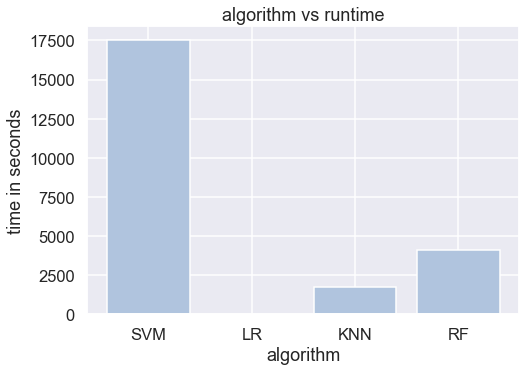

In [112]:
# graph of how long each algorithm took
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
algorithms = ['SVM', 'LR', 'KNN', 'RF']
time = [SVM_totalTime, LR_totalTime, KNN_totalTime, RF_totalTime]
ax.bar(algorithms, time, color='lightsteelblue')
plt.title('algorithm vs runtime')
plt.xlabel('algorithm')
plt.ylabel('time in seconds')

plt.show()

## Metric Results for Tables

In [126]:
# table 2
# mean test set performance across trials for each algorithm/dataset combo, with separate columns for each metric

table2 = np.array([np.mean(metricsSVMTest, axis=0), np.mean(metricsLRTest, axis=0), np.mean(metricsKNNTest, axis=0) ,np.mean(metricsRFTest, axis=0)])
print('rows = models | columns = metrics')
print('SVM  LR  KNN  RF  vs  Accuracy  AUC  FSC \n')
print(table2)

rows = models | columns = metrics
SVM  LR  KNN  RF  vs  Accuracy  AUC  FSC 

[[0.85811391 0.84869037 0.87600463]
 [0.80476671 0.86164294 0.79128   ]
 [0.81158363 0.84395884 0.80127769]
 [0.95388222 0.98587083 0.95959902]]


In [127]:
# taking means of rows to get the mean column
table2mean = np.mean(table2, axis=1)
print(table2mean)

[0.86093631 0.81922988 0.81894006 0.96645069]


In [128]:
# table 3
# mean test set performance across trials for each algorithm/metric combo

table3 = np.array([np.mean(metricsSVMTest, axis=1), np.mean(metricsLRTest, axis=1), np.mean(metricsKNNTest, axis=1), np.mean(metricsRFTest, axis=1)])
print('rows = models | columns = datasets')
print('SVM  LR  KNN  RF  vs  avila  calHousing  electric  letter \n')
print(table3)

rows = models | columns = datasets
SVM  LR  KNN  RF  vs  avila  calHousing  electric  letter 

[[0.84802065 0.68077798 0.99604584 0.91890075]
 [0.67427612 0.85229475 0.99386391 0.75648475]
 [0.80987309 0.72530413 0.77547483 0.96510817]
 [0.97560503 0.92906457 0.99979527 0.96133788]]


In [129]:
# taking means of rows to get the mean column
table3mean = np.mean(table3, axis=1)
print(table3mean)

[0.86093631 0.81922988 0.81894006 0.96645069]


In [130]:
# table 4
# mean training set performance for the optimal hyperparameters on each of the dataset/algorithm combos

table4 = np.array([np.mean(metricsSVMTrain, axis=0), np.mean(metricsLRTrain, axis=0), np.mean(metricsKNNTrain, axis=0) ,np.mean(metricsRFTrain, axis=0)])
print('rows = models | columns = metrics')
print('SVM  LR  KNN  RF  vs  Accuracy  AUC  FSC \n')
print(table4)

rows = models | columns = metrics
SVM  LR  KNN  RF  vs  Accuracy  AUC  FSC 

[[0.97761    0.74071399 0.97261118]
 [0.80624    0.86327537 0.79345053]
 [0.98667    1.         1.        ]
 [1.         1.         1.        ]]


In [131]:
# taking means of rows to get the mean column
table4mean = np.mean(table4, axis=1)
print(table4mean)

[0.89697839 0.82098863 0.99555667 1.        ]


### performing t-tests and getting p values 

In [132]:
# pvalues for table 2 

# put together lists from arrays collected right after each respective model 
accAll_P = [SVMacc, LRacc, KNNacc, RFacc]
aucAll_P = [SVMauc, LRauc, KNNauc, RFauc]
fscAll_P = [SVMfsc, LRfsc, KNNfsc, RFfsc]
accPvals = []; aucPvals = []; fscPvals = []
accTstat = []; aucTstat = []; fscTstat = []

# loop through list of 4 arrays and perform multiple t tets 
for i in range(len(accAll_P)):
    a = accAll_P[3] # rf acc because it was the highest 
    b = accAll_P[i] # cycle through all other accuracy arrays 
    tstatACC, pvalACC = stats.ttest_ind(a, b, equal_var=False)
    accPvals.append(pvalACC)
    accTstat.append(tstatACC)
    
    c = aucAll_P[3] # rf acc because it was the highest 
    d = aucAll_P[i] # cycle through all other auc arrays 
    tstatAUC, pvalAUC = stats.ttest_ind(c, d, equal_var=False)
    aucPvals.append(pvalAUC)
    aucTstat.append(tstatAUC)
    
    e = fscAll_P[3] # rf acc because it was the highest 
    f = fscAll_P[i] # cycle through all other fsc arrays 
    tstatFSC, pvalFSC = stats.ttest_ind(e, f, equal_var=False)
    fscPvals.append(pvalFSC)
    fscTstat.append(tstatFSC)
    
# print out all p values -- each row is one column of table 2 supplemental 
print(accPvals)
print(aucPvals)
print(fscPvals, '\n')
print(accTstat)
print(aucTstat)
print(fscTstat)

[0.20336211824747993, 0.11231826175597287, 0.07024360279217774, 1.0]
[0.33269024699072747, 0.09088185182472516, 0.11934614075877033, 1.0]
[0.14278064211416244, 0.15719027548102907, 0.0696317578476985, 1.0] 

[1.5376804135068776, 2.096905481174674, 2.4728733631023987, 0.0]
[1.1495073682771189, 2.390581485406211, 2.1292619813486935, 0.0]
[1.853677669522435, 1.8466359990652375, 2.6216975102704203, 0.0]


In [133]:
# calculating mean column of table 2 supplemetal 
svmMean2 = [0.858, 0.848, 0.876]
lrMean2 = [0.803, 0.861, 0.789]
knnMean2 = [0.953, 0.985, 0.959]
rfMean2 = [0.953, 0.985, 0.959, 0.966]
mean2 = [svmMean2, lrMean2, knnMean2, rfMean2]
mean2Pvals = []; mean2Tstat = []

for i in range(len(mean2)):
    a = mean2[3]
    b = mean2[i]
    tstatMean2, pvalMean2 = stats.ttest_ind(a, b, equal_var=False)
    mean2Pvals.append(pvalMean2)
    mean2Tstat.append(tstatMean2)

print(mean2Pvals, '\n')
print(mean2Tstat)

[0.0003797764162154135, 0.014600318636122534, 0.9948155062025614, 1.0] 

[9.784606035135452, 6.408150890144879, 0.006928258656565698, 0.0]


In [138]:
# p values for table 3

# put together lists from arrays collected right after each respective model 
d1All_P = [SVMd1, LRd1, KNNd1, RFd1]
d2All_P = [SVMd2, LRd2, KNNd2, RFd2]
d3All_P = [SVMd3, LRd3, KNNd3, RFd3]
d4All_P = [SVMd4, LRd4, KNNd4, RFd4]
D1Pvals = []; D2Pvals = []; D3Pvals = []; D4Pvals = []
D1Ttest = []; D2Ttest = []; D3Ttest = []; D4Ttest = []

# loop through list of 4 dataset arrays and perform multiple t tests
for i in range(len(d1All_P)):
    a = d1All_P[3] # rf d1 because it was the highest 
    b = d1All_P[i] # cycle through all other d1 arrays 
    tstatD1, pvalD1 = stats.ttest_ind(a, b, equal_var=False)
    D1Pvals.append(pvalD1)
    D1Ttest.append(tstatD1)
    
    c = d2All_P[3] # rf d2 because it was the highest 
    d = d2All_P[i] # cycle through all other d2 arrays 
    tstatD2, pvalD2 = stats.ttest_ind(c, d, equal_var=False)
    D2Pvals.append(pvalD2)
    D2Ttest.append(tstatD2)
    
    e = d3All_P[3] # rf d3 because it was the highest 
    f = d3All_P[i] # cycle through all other d3 arrays 
    tstatD3, pvalD3 = stats.ttest_ind(e, f, equal_var=False)
    D3Pvals.append(pvalD3)
    D3Ttest.append(tstatD3)
    
    g = d4All_P[2] # knn d4 because it was the highest 
    h = d4All_P[i] # cycle through all other d4 arrays 
    tstatD4, pvalD4 = stats.ttest_ind(g, h, equal_var=False)
    D4Pvals.append(pvalD4)
    D4Ttest.append(tstatD4)

# print out all p values -- each row is one column of table 3 supplemental 
print(D1Pvals)
print(D2Pvals)
print(D3Pvals)
print(D4Pvals, '\n')
print(D1Ttest)
print(D2Ttest)
print(D3Ttest)
print(D4Ttest)

[1.5290607323910062e-12, 4.526032894723786e-16, 4.5160332789444135e-11, 1.0]
[3.2716242822786365e-16, 3.142666435415971e-06, 1.9766640000363124e-10, 1.0]
[0.009431604584004657, 0.06572660288700818, 7.931313873118886e-08, 1.0]
[0.012638095959387597, 1.8629329859637892e-12, 1.0, 0.02658123216066251] 

[77.20198050654162, 209.80337213682517, 79.84517399739597, 0.0]
[210.04072473382516, 25.530837996645303, 229.18442218909902, 0.0]
[4.528630472434247, 2.5093609556435084, 91.44632521609968, 0.0]
[4.279470530501293, 151.44537378236564, 0.0, 2.8528797846501717]


In [140]:
# calculating mean column of table 3 supplemetal 
svmMean3 = [0.848, 0.680, 0.996, 0.918]
lrMean3 = [0.673, 0.850, 0.996, 0.753]
knnMean3 = [0.809, 0.725, 0.775, 0.965]
rfMean3 = [0.975, 0.929, 0.999, 0.961]
mean3 = [svmMean3, lrMean3, knnMean3, rfMean3]
mean3Pvals = []; mean3Tstat = []

for i in range(len(mean3)):
    a = mean3[3]
    b = mean3[i]
    tstatMean3, pvalMean3 = stats.ttest_ind(a, b, equal_var=False)
    mean3Pvals.append(pvalMean3)
    mean3Tstat.append(tstatMean3)

print(mean3Pvals, '\n')
print(mean3Tstat)

[0.21553088945274695, 0.12111113947050373, 0.060555010710209925, 1.0] 

[1.5311981934864132, 2.0839903461540046, 2.7409366002371387, 0.0]
